In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
# GPU Config
from SemSeg_utils import check_GPU_config

gpu_device = check_GPU_config()
print(f"GPU config: {gpu_device}")

2024-11-25 15:56:41.365611: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-11-25 15:56:41.375134: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-11-25 15:56:41.385406: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-11-25 15:56:41.388283: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-11-25 15:56:41.396437: I tensorflow/core/platform/cpu_feature_guar

Configured TensorFlow to use GPU: /physical_device:GPU:0
Memory growth enabled for the first GPU.
Physical GPUs: 1, Logical GPUs: 1
TensorFlow version: 2.17.0
CUDA device detected: True
Instructions for updating:
Use `tf.config.list_physical_devices('GPU')` instead.
GPU availability: True
GPU config: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


I0000 00:00:1732561002.719328   38793 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1732561002.742301   38793 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1732561002.742484   38793 cuda_executor.cc:1015] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
I0000 00:00:1732561002.743568   38793 cuda_executor.cc:1015] successful NUMA node read from SysFS ha

## 1. Data prep

### Input images

In [3]:
# Get the data
#!unzip -qq ./data/massachusetts_buildings_dataset.zip -d ./data/massachusetts-buildings-dataset

In [4]:
from SemSeg_utils import (
    read_and_preprocess_images,
    plot_train_images_and_masks,
    plot_val_images_and_masks,
    plot_test_images_and_masks
)

In [5]:
base_dir = './data/massachusetts-buildings-dataset/png'

images_dir ='./data/massachusetts-buildings-dataset/png/train'
masks_dir = './data/massachusetts-buildings-dataset/png/train_labels'
val_images_dir ='./data/massachusetts-buildings-dataset/png/val'
val_masks_dir = './data/massachusetts-buildings-dataset/png/val_labels'
test_images_dir='./data/massachusetts-buildings-dataset/png/test'
test_masks_dir='./data/massachusetts-buildings-dataset/png/test_labels'

In [6]:
# Leer los datos de train, validation y test
train_images, train_masks = read_and_preprocess_images(images_dir, masks_dir)
val_images, val_masks = read_and_preprocess_images(val_images_dir, val_masks_dir)
test_images, test_masks = read_and_preprocess_images(test_images_dir, test_masks_dir)

print("Train set:", train_images.shape, train_masks.shape)
print("Validation set:", val_images.shape, val_masks.shape)
print("Test set:", test_images.shape, test_masks.shape)

Train set: (137, 512, 512, 3) (137, 512, 512, 1)
Validation set: (4, 512, 512, 3) (4, 512, 512, 1)
Test set: (10, 512, 512, 3) (10, 512, 512, 1)


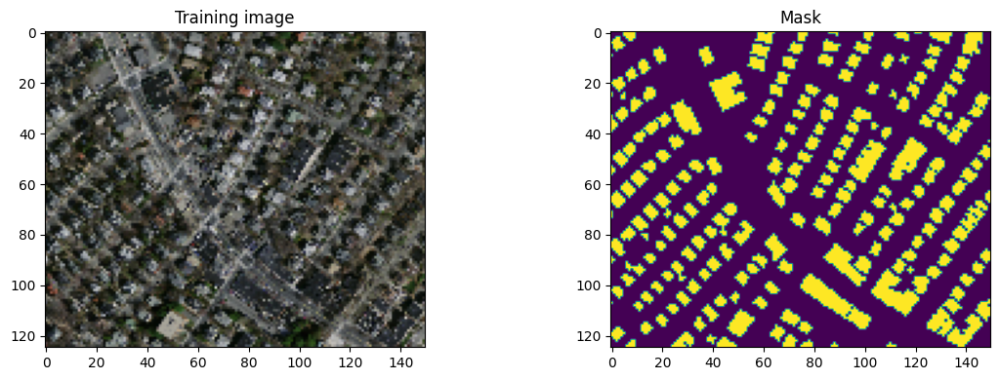

In [7]:
import matplotlib.pyplot as plt

f = plt.figure(figsize=(12,4))
ax1 = f.add_subplot(1,2,1)
ax2 = f.add_subplot(1,2,2)

# zoom in
ax1.set_title("Training image")
ax1.imshow(train_images[0][:125, 0:150])

ax2.set_title("Mask")
ax2.imshow(train_masks[0][:125, 0:150])

plt.tight_layout()
plt.show()

A continuación, se reasigna parte del set de entrenamiento a validación para mejorar la evaluación del rendimiento del modelo (mantener `test_images` independiente)

In [8]:
from sklearn.model_selection import train_test_split
import numpy as np
from SemSeg_utils import calculate_class_balance

# Calcular balance de clases antes de la división
print("Balance de clases (antes de división):")
print(calculate_class_balance(train_masks))

# Reasignar 20% de las imágenes de entrenamiento al conjunto de validación
train_images, val_images_additional, train_masks, val_masks_additional = train_test_split(
    train_images, train_masks, test_size=0.2, random_state=42
)

# Combinar las imágenes de validación originales con las reasignadas
val_images = np.concatenate((val_images, val_images_additional), axis=0)
val_masks = np.concatenate((val_masks, val_masks_additional), axis=0)

# Verificar balance de clases después de reasignar
print("Balance de clases (después de reasignar):")
print("Conjunto de entrenamiento:", calculate_class_balance(train_masks))
print("Conjunto de validación:", calculate_class_balance(val_masks))

# Imprimir tamaños de los conjuntos
print("Nuevo tamaño del conjunto de entrenamiento:", train_images.shape, train_masks.shape)
print("Nuevo tamaño del conjunto de validación:", val_images.shape, val_masks.shape)

Balance de clases (antes de división):
{'background': 0.8460559427303119, 'buildings': 0.15394405726968807}
Balance de clases (después de reasignar):
Conjunto de entrenamiento: {'background': 0.8470772209517453, 'buildings': 0.15292277904825474}
Conjunto de validación: {'background': 0.8460613489151001, 'buildings': 0.1539386510848999}
Nuevo tamaño del conjunto de entrenamiento: (109, 512, 512, 3) (109, 512, 512, 1)
Nuevo tamaño del conjunto de validación: (32, 512, 512, 3) (32, 512, 512, 1)


In [9]:
# Revisar balanceo de clases fondo y edificio en entrenamiento
class_ratios = calculate_class_balance(train_masks)
print(f"Balance de clases: {class_ratios}")

# Definir los pesos basados en el balance
class_weights = {
    0: 1.0 / class_ratios['background'],  # Peso para fondo
    1: 1.0 / class_ratios['buildings']    # Peso para edificios
}
print(f"Pesos de las clases: {class_weights}")

Balance de clases: {'background': 0.8470772209517453, 'buildings': 0.15292277904825474}
Pesos de las clases: {0: 1.180529915414838, 1: 6.539248150103591}


In [10]:
#ON/OFF
activate_advanced_norm = False

#Make a copy of non normalized sets
train_images_ = train_images.copy()
val_images_ = val_images.copy()

if activate_advanced_norm:
    # TODO: Remove (bad results)
    print("Normalizing training and validation sets")
    from sklearn.preprocessing import StandardScaler

    # Normalización por canales (usar media y desvio en lugar de 0 y 1)
    train_images_flat = train_images.reshape(-1, train_images.shape[-1])
    scaler = StandardScaler()
    train_images_norm = scaler.fit_transform(train_images_flat).reshape(train_images.shape)
    val_images_norm = scaler.transform(val_images.reshape(-1, val_images.shape[-1])).reshape(val_images.shape)

### Input images & Ground truth masks

Train Images and Masks:


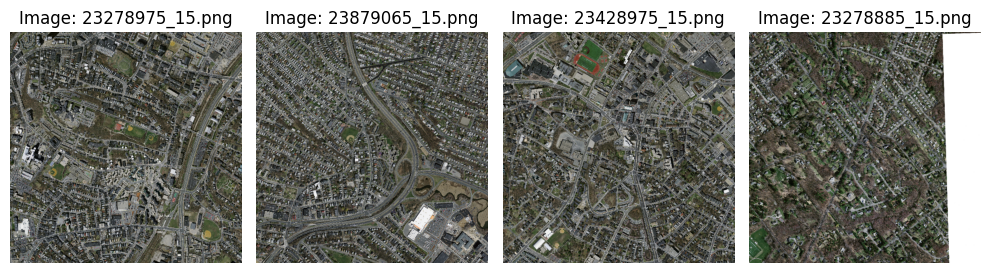

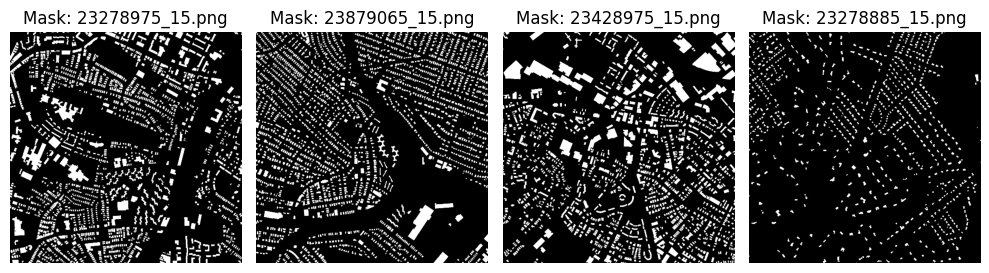

In [11]:
import numpy as np
import os

# Seleccionar imágenes aleatorias
train_random_files = np.random.choice(os.listdir(images_dir), size=min(9, len(os.listdir(images_dir))), replace=False)
val_random_files = np.random.choice(os.listdir(val_images_dir), size=min(9, len(os.listdir(val_images_dir))), replace=False)
test_random_files = np.random.choice(os.listdir(test_images_dir), size=min(9, len(os.listdir(test_images_dir))), replace=False)

# Visualizar imágenes y máscaras de train
plot_train_images_and_masks(images_dir, masks_dir, train_random_files, rows=1, cols=4)

Validation Images and Masks:


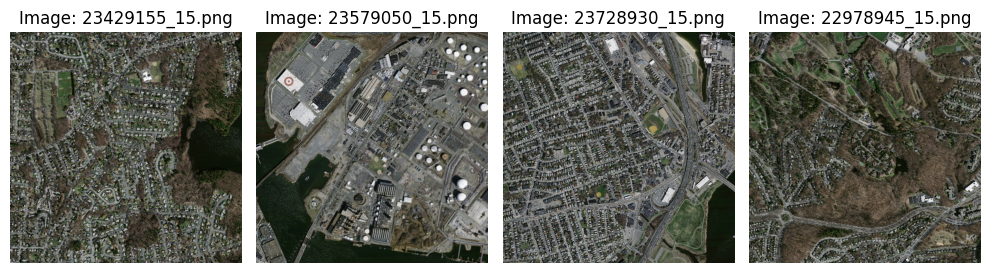

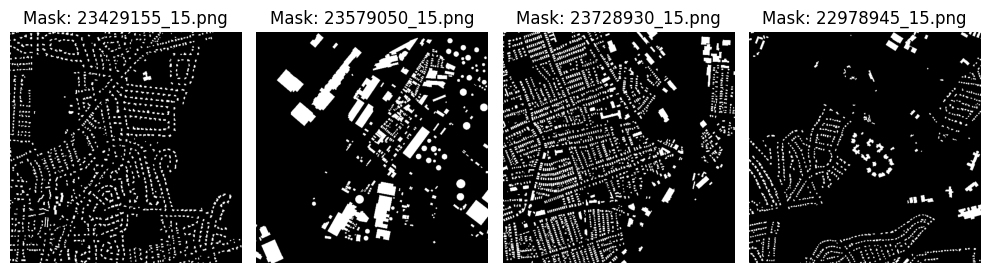

In [12]:
# Visualizar imágenes y máscaras de validation
plot_val_images_and_masks(val_images_dir, val_masks_dir, val_random_files, rows=1, cols=4)

Test Images and Masks:


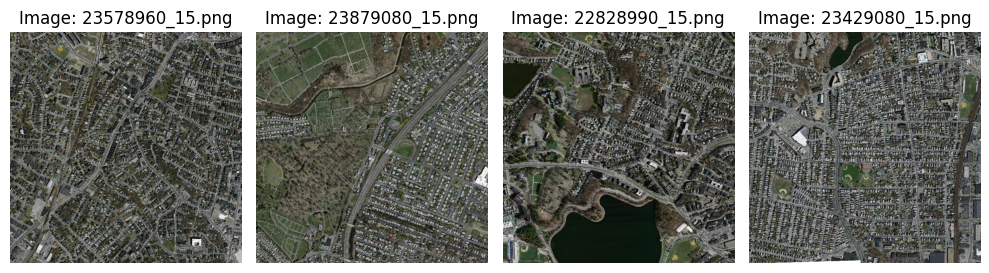

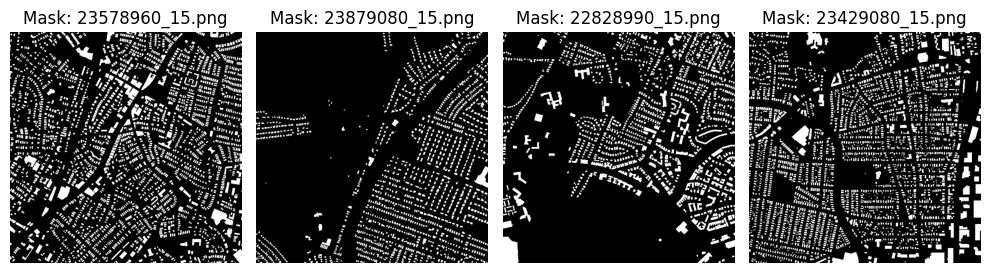

In [13]:
# Visualizar imágenes y máscaras de test
plot_test_images_and_masks(test_images_dir, test_masks_dir, test_random_files, rows=1, cols=4)

In [14]:
# Data augmentation
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from SemSeg_utils import data_generator

# mas agresivo

datagen = ImageDataGenerator(
    rotation_range=45,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.3,
    horizontal_flip=True,
    vertical_flip=True  # Inversión vertical adicional
)

# Verify shapes
augmented_train_data = data_generator(datagen, train_images, train_masks, batch_size=4)

## 2. Compile and train U-Net

In [15]:
from SemSeg_utils import(
    configure_model, 
    #combined_focal_iou_loss,
    #get_weighted_loss,
    visualize_predictions,
    plot_training_history
)

In [16]:
# Configurar el modelo y callbacks

train_size = len(train_images)

# Obtener la función de pérdida ponderada
#loss_function = get_weighted_loss(class_weights)
#loss_function = lambda y_true, y_pred: combined_focal_iou_loss(y_true, y_pred)

# Configurar el modelo con la pérdida ponderada
unet_model, callbacks = configure_model(
    input_shape=(512, 512, 3),
    use_lr_schedule=True,
    train_size=train_size,
    loss_function=None # use default or call the loss_function
)

unet_model.summary()

unet_result = unet_model.fit(
    augmented_train_data,
    validation_data=(val_images, val_masks),
    steps_per_epoch=train_size // 4,  # Ajusta el número de pasos por época
    epochs=50,
    callbacks=callbacks
)

COMPILING MODEL WITH LR SCHEDULER
Using default combined_focal_dice_loss


Model: "U-Net_Optimized"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 512, 512,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 512, 512,  │        896 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 512, 512,  │          0 │ conv2d[0][0]      │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 512, 512,  │      9,248 │ dropout[0][0]     │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 256, 256,  │          0 │ conv2d_1[0][0]    │
│ (MaxPooling2D)      │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 256, 256,  │     18,496 │ max_pooling2d[0]… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 256, 256,  │          0 │ conv2d_2[0][0]    │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 256, 256,  │     36,928 │ dropout_1[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_1     │ (None, 128, 128,  │          0 │ conv2d_3[0][0]    │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 128, 128,  │     73,856 │ max_pooling2d_1[… │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_2 (Dropout) │ (None, 128, 128,  │          0 │ conv2d_4[0][0]    │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_5 (Conv2D)   │ (None, 128, 128,  │    147,584 │ dropout_2[0][0]   │
│                     │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_2     │ (None, 64, 64,    │          0 │ conv2d_5[0][0]    │
│ (MaxPooling2D)      │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_6 (Conv2D)   │ (None, 64, 64,    │    295,168 │ max_pooling2d_2[… │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_3 (Dropout) │ (None, 64, 64,    │          0 │ conv2d_6[0][0]    │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_7 (Conv2D)   │ (None, 64, 64,    │    590,080 │ dropout_3[0][0]   │
│                     │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d_3     │ (None, 32, 32,    │          0 │ conv2d_7[0][0]  

 Total params: 8,630,497 (32.92 MB)

 Trainable params: 8,630,497 (32.92 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/50


I0000 00:00:1732561047.307498   38868 service.cc:146] XLA service 0x7f827000da30 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1732561047.307531   38868 service.cc:154]   StreamExecutor device (0): NVIDIA GeForce RTX 4070, Compute Capability 8.9
2024-11-25 15:57:27.397623: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:268] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-11-25 15:57:27.846463: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:531] Loaded cuDNN version 8907
2024-11-25 15:57:35.772979: W external/local_tsl/tsl/framework/bfc_allocator.cc:363] Garbage collection: deallocate free memory regions (i.e., allocations) so that we can re-allocate a larger region to avoid OOM due to memory fragmentation. If you see this message frequently, you are running near the threshold of the available device memory and re-allocation may incur great performance overhead.

 1/27 ━━━━━━━━━━━━━━━━━━━━ 8:03 19s/step - accuracy: 0.4378 - f1_score: 0.2510 - iou_coeff: 0.1385 - loss: 1.5938

I0000 00:00:1732561063.066157   38868 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 141ms/step - accuracy: 0.2939 - f1_score: 0.2758 - iou_coeff: 0.1586 - loss: 1.5920

2024-11-25 15:57:53.516611: W external/local_tsl/tsl/framework/bfc_allocator.cc:291] Allocator (GPU_0_bfc) ran out of memory trying to allocate 10.09GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2024-11-25 15:57:55.114029: W external/local_tsl/tsl/framework/bfc_allocator.cc:291] Allocator (GPU_0_bfc) ran out of memory trying to allocate 9.16GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2024-11-25 15:57:57.459489: W external/local_tsl/tsl/framework/bfc_allocator.cc:291] Allocator (GPU_0_bfc) ran out of memory trying to allocate 18.30GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2024-11-25 15:57:59.149864: W external/local_tsl/tsl/framework/bf


Learning rate for epoch 1 is 0.0009999996982514858

Epoch 1: val_loss improved from inf to 1.54089, saving model to best_model.keras


/home/federico/Projects/imgClassification/venv/lib/python3.10/site-packages/keras/src/saving/serialization_lib.py:390: UserWarning: The object being serialized includes a `lambda`. This is unsafe. In order to reload the object, you will have to pass `safe_mode=False` to the loading function. Please avoid using `lambda` in the future, and use named Python functions instead. This is the `lambda` being serialized:         loss_function = lambda y_true, y_pred: combined_focal_dice_loss(y_true, y_pred, beta=2.0)

  return {key: serialize_keras_object(value) for key, value in obj.items()}


27/27 ━━━━━━━━━━━━━━━━━━━━ 47s 1s/step - accuracy: 0.2986 - f1_score: 0.2774 - iou_coeff: 0.1595 - loss: 1.5911 - val_accuracy: 0.8360 - val_f1_score: 0.3054 - val_iou_coeff: 0.1727 - val_loss: 1.5409
Epoch 2/50


2024-11-25 15:58:16.855607: W external/local_tsl/tsl/framework/bfc_allocator.cc:291] Allocator (GPU_0_bfc) ran out of memory trying to allocate 16.27GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2024-11-25 15:58:16.988077: W external/local_tsl/tsl/framework/bfc_allocator.cc:291] Allocator (GPU_0_bfc) ran out of memory trying to allocate 16.15GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.


27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 202ms/step - accuracy: 0.7302 - f1_score: 0.3525 - iou_coeff: 0.2126 - loss: 1.5175
Learning rate for epoch 2 is 0.0009999986505135894

Epoch 2: val_loss improved from 1.54089 to 1.44960, saving model to best_model.keras
27/27 ━━━━━━━━━━━━━━━━━━━━ 17s 235ms/step - accuracy: 0.7292 - f1_score: 0.3519 - iou_coeff: 0.2122 - loss: 1.5174 - val_accuracy: 0.5473 - val_f1_score: 0.3767 - val_iou_coeff: 0.2220 - val_loss: 1.4496
Epoch 3/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 176ms/step - accuracy: 0.7204 - f1_score: 0.3964 - iou_coeff: 0.2423 - loss: 1.3832
Learning rate for epoch 3 is 0.000999996904283762

Epoch 3: val_loss improved from 1.44960 to 1.33087, saving model to best_model.keras
27/27 ━━━━━━━━━━━━━━━━━━━━ 6s 209ms/step - accuracy: 0.7210 - f1_score: 0.3971 - iou_coeff: 0.2429 - loss: 1.3819 - val_accuracy: 0.7151 - val_f1_score: 0.4353 - val_iou_coeff: 0.2676 - val_loss: 1.3309
Epoch 4/50
27/27 ━━━━━━━━━━━━━━━━━━━━ 0s 204ms/step - accuracy: 0.7610 - f1_score

## 3. Evaluate results

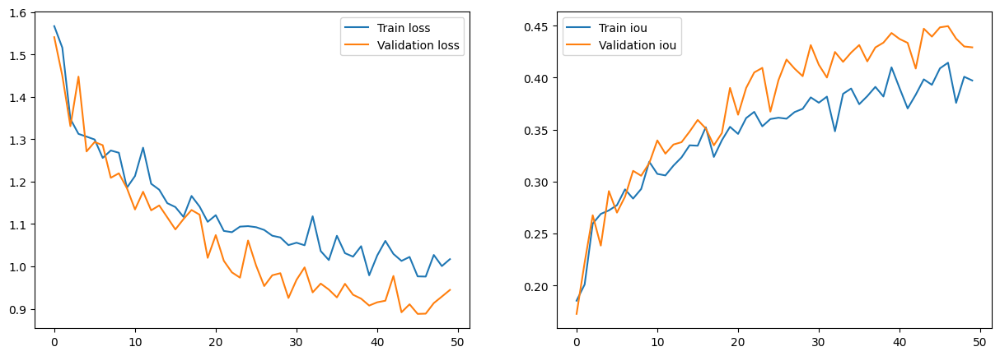

In [17]:
plot_training_history(unet_result)

In [18]:
test_result = unet_model.evaluate(test_images, test_masks, batch_size=4)
print(f"Test Loss: {test_result[0]}, Test IoU: {test_result[2]}, Test F1: {test_result[3]}")

2024-11-25 16:06:33.701318: W external/local_tsl/tsl/framework/bfc_allocator.cc:291] Allocator (GPU_0_bfc) ran out of memory trying to allocate 16.52GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.


3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 2s/step - accuracy: 0.8542 - f1_score: 0.6869 - iou_coeff: 0.5198 - loss: 0.7644
Test Loss: 0.7720562219619751, Test IoU: 0.5140921473503113, Test F1: 0.6822214126586914


1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


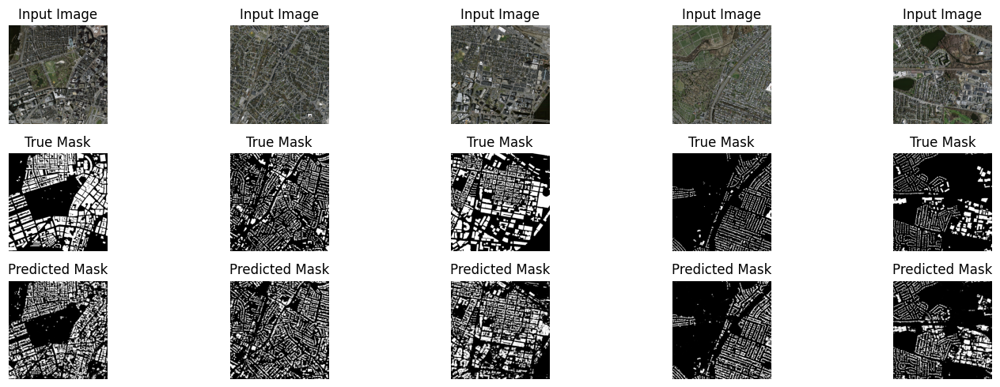

In [19]:
visualize_predictions(unet_model, test_images, test_masks, num_examples=5)

In [20]:
from SemSeg_utils import visualize_predictions_with_thresholds
from sklearn.metrics import jaccard_score

unet_predict = unet_model.predict(test_images)

1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step


#### Evaluación de áreas extremas e intermedias.

A continuación, visualizamos cómo se distribuyen los valores de probabilidad del modelo. Si el comportamiento es polarizado entre extremos (0 y 1), entonces definir un umbral de precisión.

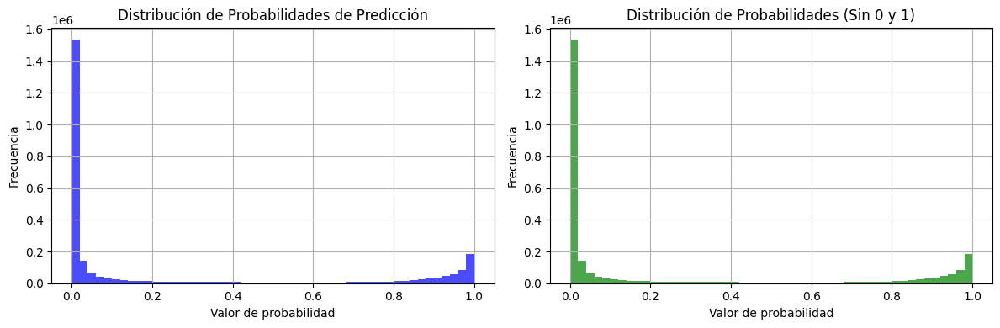

In [21]:
predicted_probs = unet_predict.flatten()

f = plt.figure(figsize=(12, 4))
ax1 = f.add_subplot(1, 2, 1)
ax2 = f.add_subplot(1, 2, 2)

ax1.hist(predicted_probs, bins=50, range=(0, 1), color='blue', alpha=0.7)
ax1.set_title("Distribución de Probabilidades de Predicción")
ax1.set_xlabel("Valor de probabilidad")
ax1.set_ylabel("Frecuencia")
ax1.grid(True)

non_extreme_predictions = predicted_probs[(predicted_probs > 0) & (predicted_probs < 1)]

ax2.hist(non_extreme_predictions, bins=50, color='green', alpha=0.7)
ax2.set_title("Distribución de Probabilidades (Sin 0 y 1)")
ax2.set_xlabel("Valor de probabilidad")
ax2.set_ylabel("Frecuencia")
ax2.grid(True)

plt.tight_layout()
plt.show()

Mostrando resultados para índice: 7


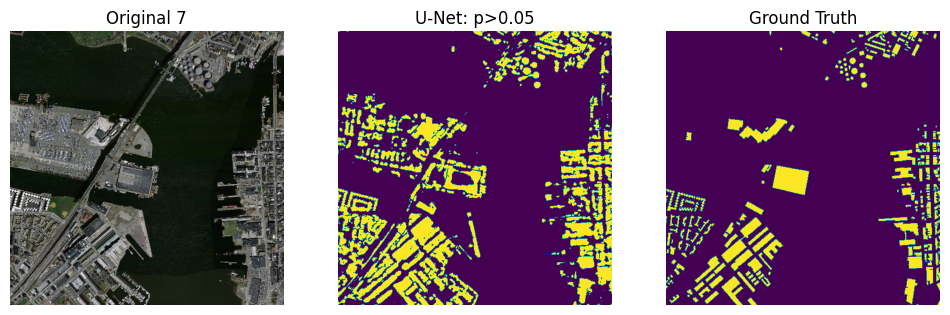

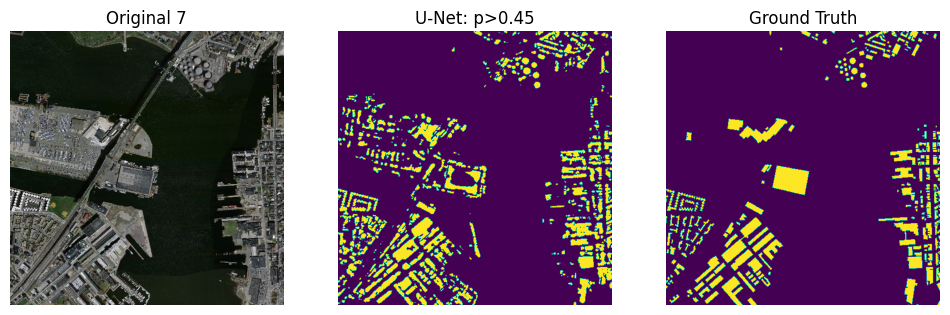

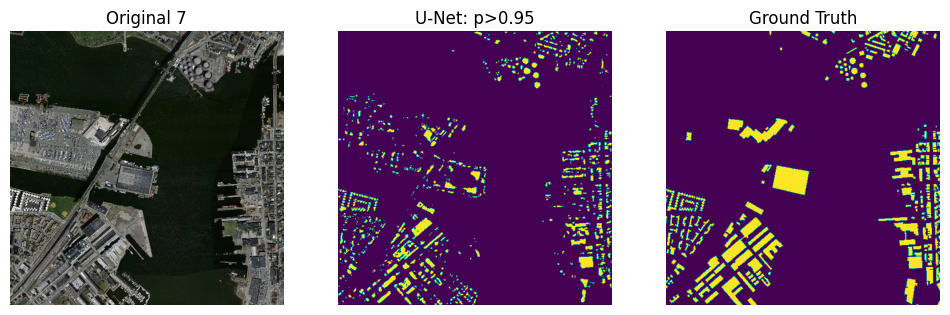


Mostrando resultados para índice: 9


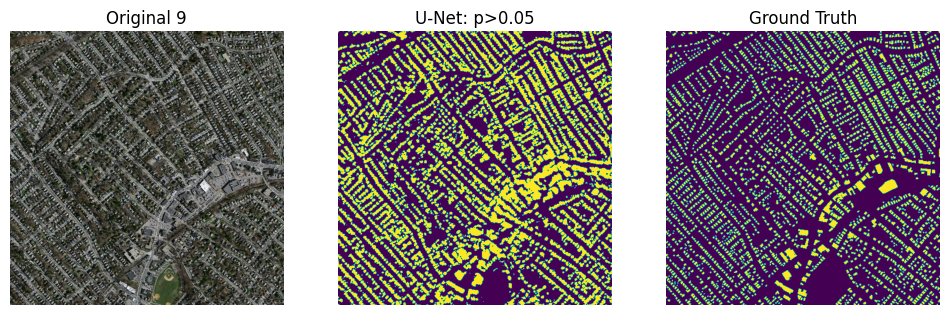

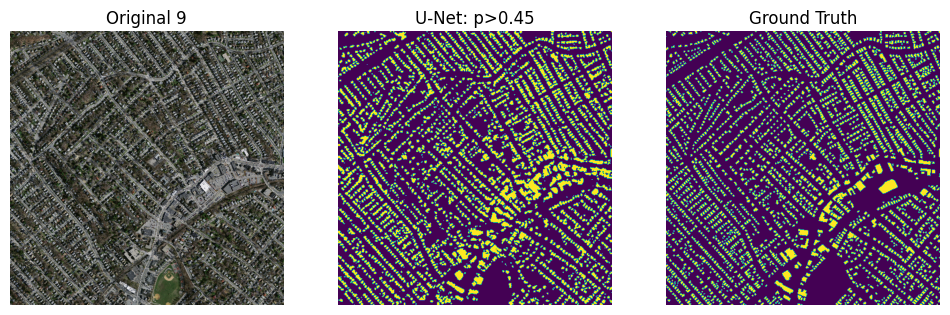

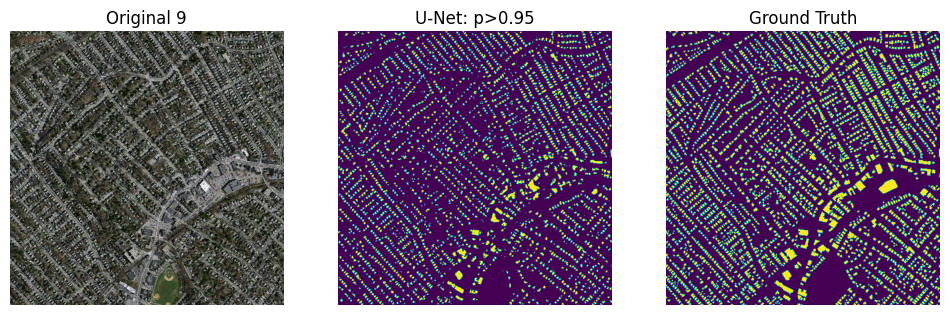


Mostrando resultados para índice: 0


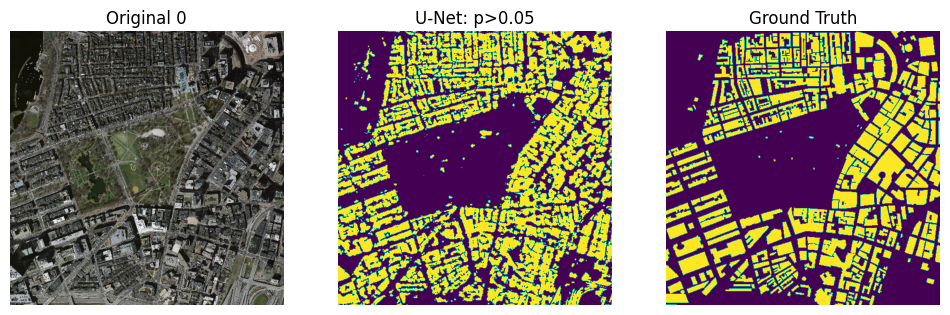

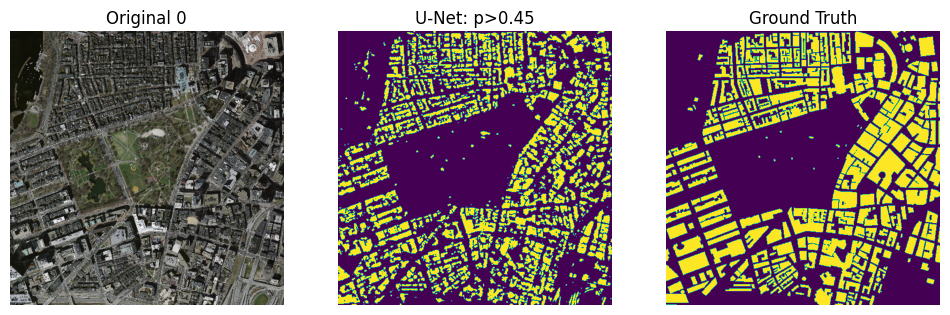

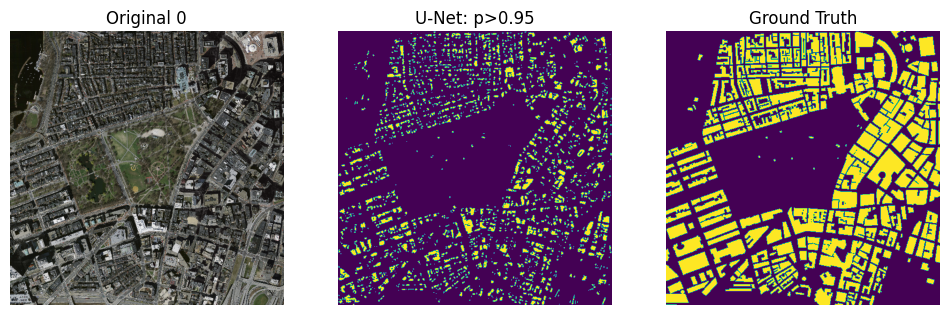

In [22]:
# Lista de umbrales deseados
#thresholds = [0.8, 0.85, 0.9, 0.92, 0.95]
thresholds = [0.05, 0.45, 0.95]

# Llamada a la función optimizada
visualize_predictions_with_thresholds(test_images, test_masks, unet_predict, thresholds)


In [23]:
for p in thresholds: # la tendencia es razonable
    unet_binarized = (unet_predict > p).astype(np.uint8).flatten()
    ground_truth = test_masks.flatten()
    iou = jaccard_score(ground_truth, unet_binarized, average='binary')
    print(f"IoU for p>{p}: {iou:.4f}")


IoU for p>0.05: 0.4830
IoU for p>0.45: 0.5206
IoU for p>0.95: 0.4029


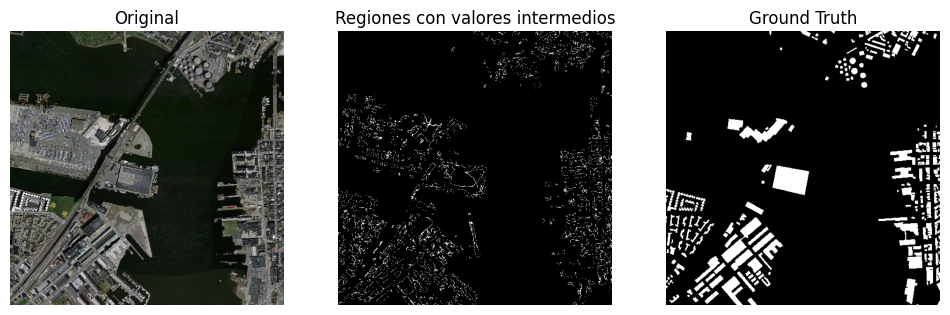

In [24]:
import random

# Filtrar valores intermedios
intermediate_predictions = (unet_predict > 0.3) & (unet_predict < 0.7)

# Visualizar áreas con valores intermedios
idx = random.choice(range(len(test_images)))
plt.figure(figsize=(12, 6))
plt.subplot(1, 3, 1)
plt.title("Original")
plt.imshow(test_images[idx])
plt.axis("off")

plt.subplot(1, 3, 2)
plt.title("Regiones con valores intermedios")
plt.imshow(intermediate_predictions[idx].squeeze(), cmap="gray")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.title("Ground Truth")
plt.imshow(test_masks[idx].squeeze(), cmap="gray")
plt.axis("off")

plt.show()